# Kurtosis Experiments

For our kurtosis experiments, we will test different integrands and use RQMC with $R$ independent replications and $n$ QMC points per replication. We will use the following RQMC Methods: LMS_DS, DS, and NUS for Sobol. The $n$ will be varied from $2^0$ to $2^{8}$ while $R$ will be kept constant at 1000. The goal is to see how the kurtosis changes as $n$ changes for the different RQMC methods listed above.

Kurtosis formula: 
$
\text{Kurt}(X) = \frac{\mathbb{E}\big[(X - \mu)^4\big]}{\sigma^4}
$

In this notebook, we use two one dimensional integrands: 

$Y = f(x) = \frac{x e^x}{e}$ (referred to as "smooth_1d" in our code)

$ Y = f(x) = \begin{cases} 
1 & \text{if } x < \frac{1}{3} \\
0 & \text{otherwise}
\end{cases}$ (referred to as "discontinuous_1d" in our code)

We also use the following integrand with any dimension $d$:

$
Y = f(\mathbf{x}) = \sum_{j=1}^d x_j e^{x_j} 
$ (referred to as "smooth_anyd" in our code)


We also use the following ridge functions:

1. $ g_{jmp}(w) = 1{\{w \geq 1\}} $
2. $ g_{knk}(w) = \frac {\min(\max(−2, w), 1) + 2} {3} $
3. $ g_{smo}(w) = \Phi (w)$
4. $ g_{fin}(w) = \min(1,\sqrt{\max(w + 2, 0)}/2) $

$w = \frac{1}{\sqrt{d}} \sum_{j=1}^{d}\Phi^{-1}(x_{j})$, $\Phi(.)$ is the CDF of standard Normal Distribution on R, denoted by $ \mathcal{N}(0,1)$, and $x \sim U(0, 1)^d$.

In [23]:
import qmcpy as qp
from scipy.stats import kurtosis,norm
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import stats

Setting up the parameters to be used:

In [24]:
qmc_generators = {
    "Sobol": ["LMS_DS","DS", "NUS"]
} # The different QMC generators with different randomizations
num_randomizations = sum(len(rands) for rands in qmc_generators.values())
labels = []
for gen, rands in qmc_generators.items():
    for rand in rands:
        labels.append(f"{gen}_{rand}")
labels = np.array(labels)

R = 1000 # The number of independent replications
n_vary = 2**np.arange(0,9) # The different number of QMC points per replication

fs = {
    "smooth_1d": lambda x: x[...,0]*np.exp(x[...,0])/np.exp(1), 
    "discontinuous_1d": lambda x: (x[...,0]) < (1/3),
} # The one dimensional integrand functions


gs = {
    "jmp": lambda w: w>=1, 
    "knk": lambda w: ((np.minimum(np.maximum(-2,w),1)) + 2) / 3,
    "smo": lambda w: norm.cdf(w + 1),
    "fin": lambda w: np.minimum(1,((np.sqrt(np.maximum(w+2,0)))/2)),
    "smooth_anyd": lambda w: np.sum(w * np.exp(w), axis=2)
} # The ridge functions and integrand with any dimension d

d = np.array([1,2,4,8]) # The different d's to test on for ridge functions and integrand with any dimension d

# seed setting

global_seed = 7
parent_seed = np.random.SeedSequence(global_seed)

The function to generate IID replications of QMC samples

In [25]:
def gen_qmc_samples_iid(discrete_distrib, n = 2**8, function = None, ridge = False):
    x_rld = discrete_distrib.gen_samples(n).reshape((discrete_distrib.replications,n,discrete_distrib.d))
    if ridge is True:
        return x_rld
    if function is None:
        y_rld = x_rld[...,0]
    else:
        y_rld = function(x_rld)
    return y_rld.mean(1),y_rld.flatten()

Generating the QMC samples that will be used in both the ridge and integrands

In [26]:
x_qmc_arr = np.empty((len(labels), len(n_vary)), dtype=object)
counter = 0
for gen, rands in qmc_generators.items():
    for rand in rands:
        for i in range(len(n_vary)):
            child_seed = parent_seed.spawn(1)[0]
            if gen.lower() == "sobol":
                distrib = qp.Sobol(d[-1], randomize = rand, seed = child_seed, replications = R)
            elif gen.lower() == 'halton':
                distrib = qp.Halton(d[-1], randomize = rand, seed = child_seed, replications = R)
            else:
                distrib = qp.Lattice(d[-1], randomize = rand, seed = child_seed, replications = R)
            x_qmc_arr[counter,i] = gen_qmc_samples_iid(discrete_distrib=distrib,n = n_vary[i],ridge = True)
        counter = counter + 1

### Ridge Function and Integrand with any dimension $d$ Simulation

In [27]:
qmc_arr_ridge = np.empty((len(labels),len(d),len(gs), len(n_vary)),dtype=object)
kurr_ridge = np.empty((len(labels),len(d),len(gs), len(n_vary)))
counter = 0
for gen, rands in qmc_generators.items():
    for rand in rands:
        for i in range(len(n_vary)):
            x_qmc = norm.ppf(x_qmc_arr[counter, i])
            for j in range (len(d)):
                w_qmc = x_qmc[:, :, :d[j]].sum(axis = 2)/np.sqrt(d[j])
                g_counter = 0
                for g in gs.values():
                    if g_counter == (len(gs) - 1):
                        x_qmc_int = x_qmc_arr[counter, i]
                        w_qmc = x_qmc_int[:,:,:d[j]]
                    qmc_arr_ridge[counter, j, g_counter,i] = g(w_qmc).mean(axis = 1)
                    kurr_ridge[counter, j, g_counter, i] = kurtosis(qmc_arr_ridge[counter, j, g_counter,i], bias=False, fisher=False)
                    g_counter = g_counter + 1
        counter = counter + 1

Histograms, QQ plots vs normal (not standard but with same mean and std as the particular data), and kurtosis vs $n$ for Ridge Function and Integrand with any dimension $d$ Simulations

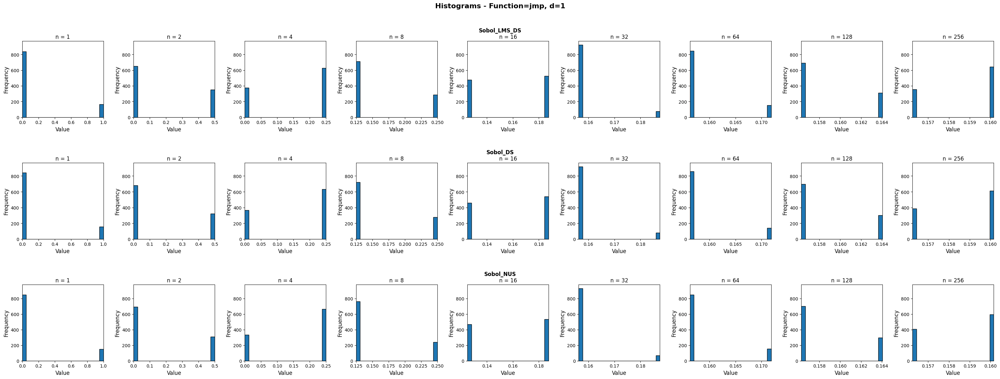

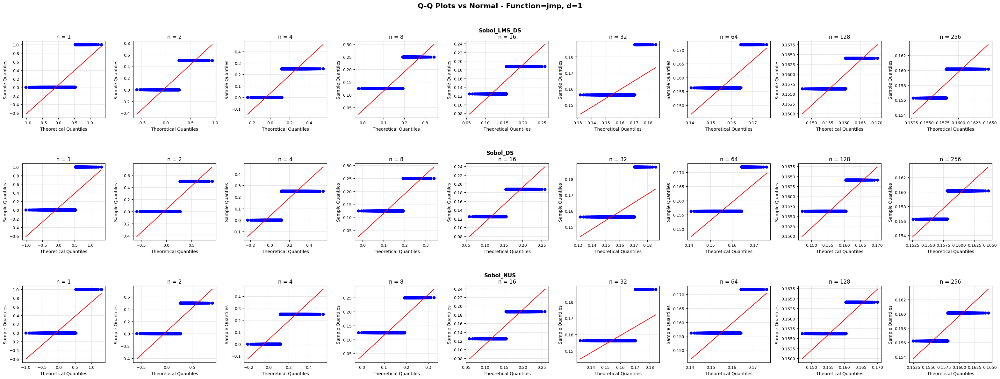

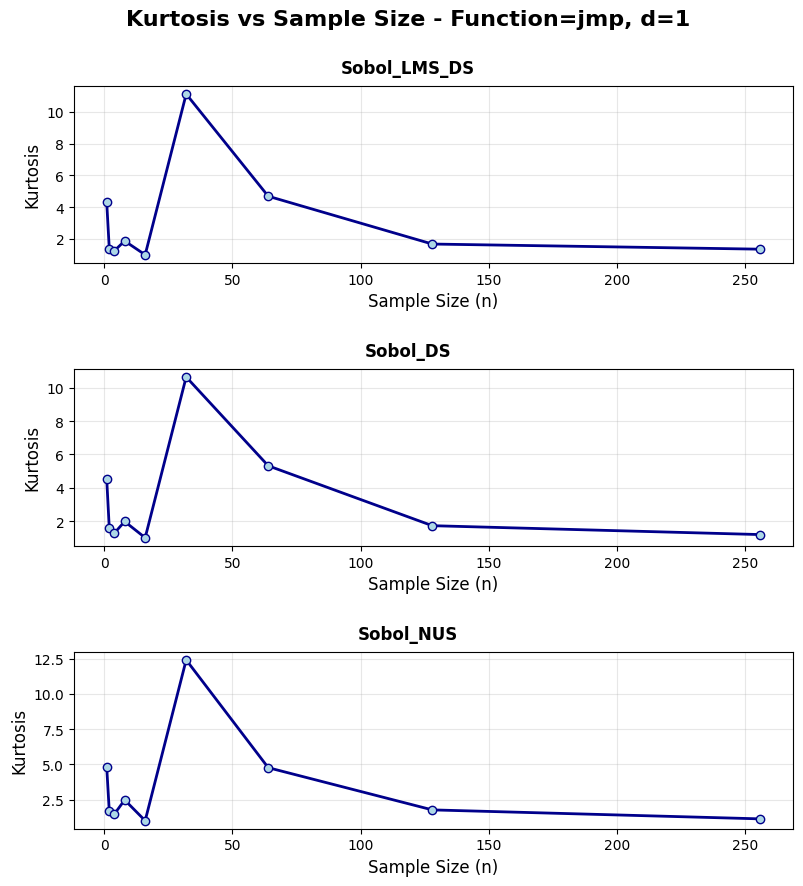

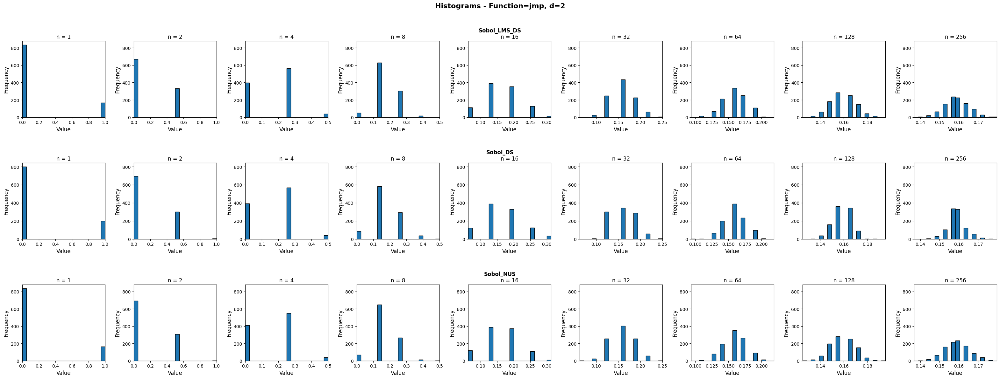

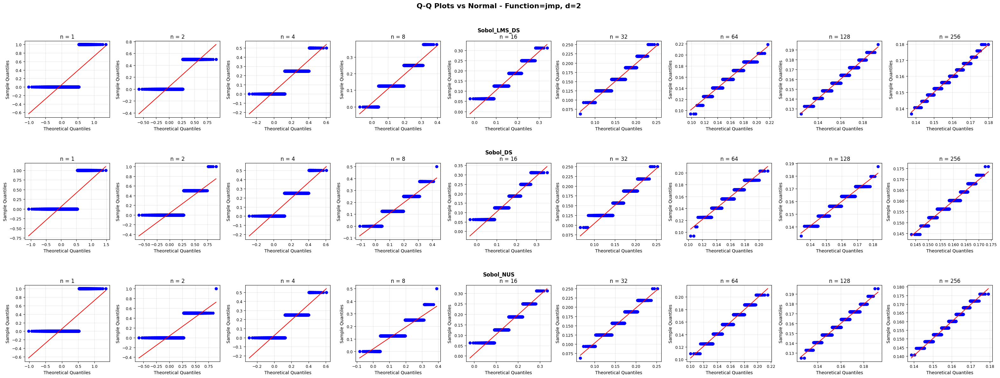

...

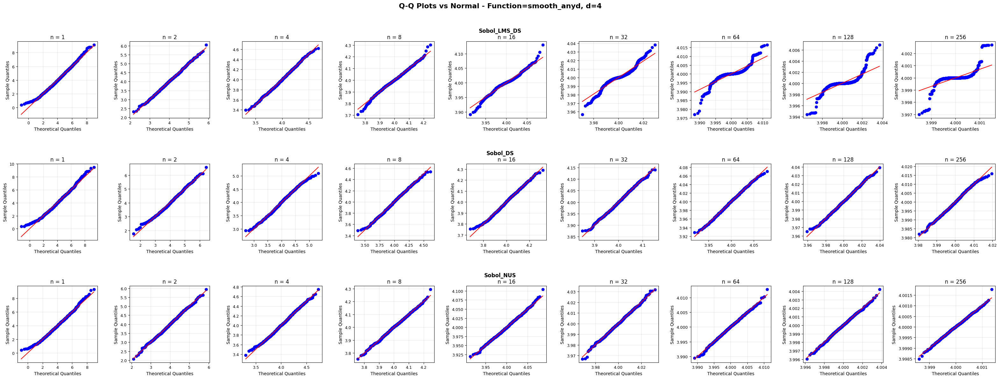

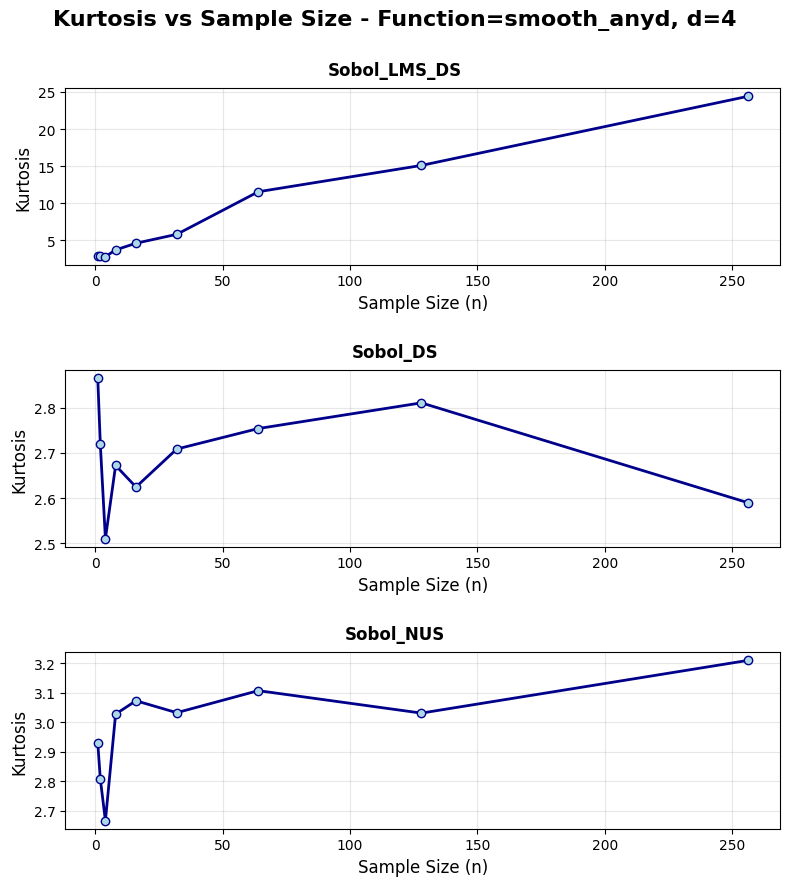

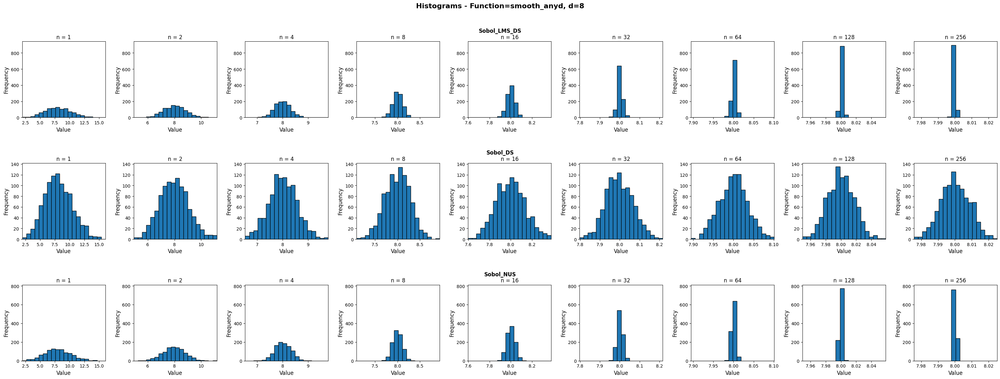

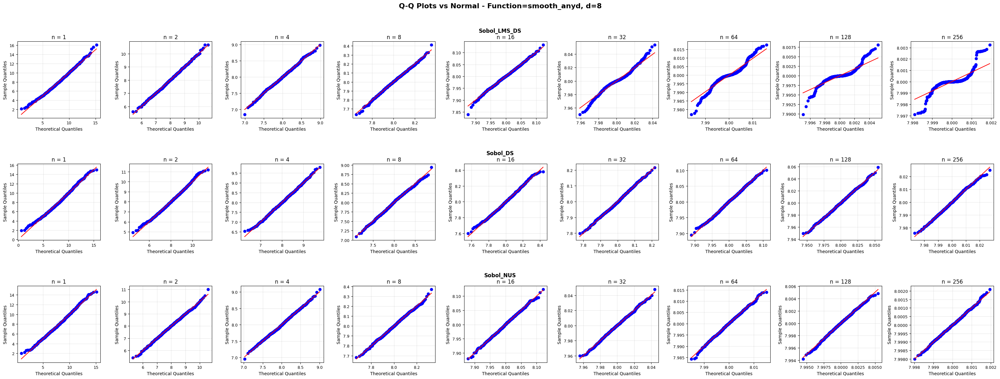

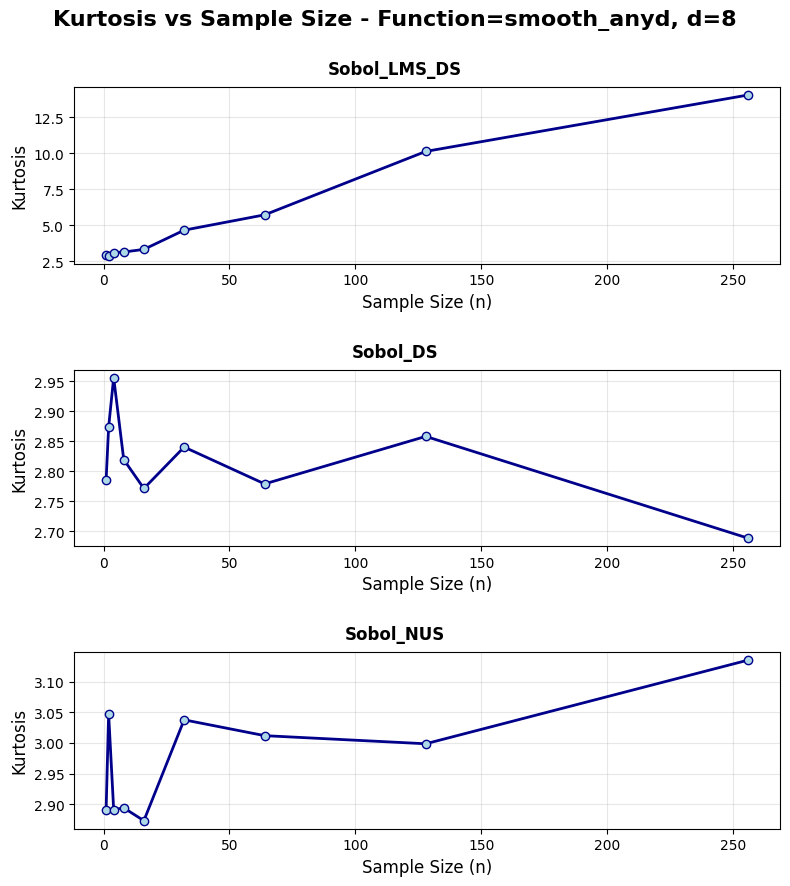

In [28]:
for i_g, (gname, gfunc) in enumerate(gs.items()):
    for i_d, dd in enumerate(d):

        fig, axes = plt.subplots(
            nrows=len(labels),
            ncols=len(n_vary),
            figsize=(3.5*len(n_vary), 4*len(labels)),
            squeeze=False
        )

        x_lims = []
        for j in range(len(n_vary)):
            col_data = []
            for i_l in range(len(labels)):
                data = qmc_arr_ridge[i_l, i_d, i_g, j]
                if data is not None:
                    col_data.append(data)
            if col_data:
                all_data_j = np.concatenate(col_data)
                x_lims.append((all_data_j.min(), all_data_j.max()))
            else:
                x_lims.append((0, 1))

        # --- make histograms ---
        for i_l, label in enumerate(labels):

            max_ylim_row = 0
            for j, n in enumerate(n_vary):
                data = qmc_arr_ridge[i_l, i_d, i_g, j]
                if data is None:
                    continue
                counts, _, _ = axes[i_l, j].hist(
                    data, bins=20, range=x_lims[j], edgecolor="black"
                )
                max_ylim_row = max(max_ylim_row, counts.max())

            for j, n in enumerate(n_vary):
                ax = axes[i_l, j]
                ax.set_xlim(x_lims[j])
                ax.set_ylim(0, max_ylim_row * 1.05)
                ax.set_xlabel("Value", fontsize=12)
                ax.set_ylabel("Frequency", fontsize=12)
                ax.set_title(f"n = {n}", fontsize=12)
                ax.tick_params(axis="both", labelsize=10)

        fig.suptitle(f"Histograms - Function={gname}, d={dd}", fontsize=16, weight='bold', y=0.99)

        fig.tight_layout(rect=[0, 0, 1, 0.95])
        
        fig.subplots_adjust(hspace=0.6)  
        
        for i_l, label in enumerate(labels):
            top_subplot = axes[i_l, 0]
            bbox = top_subplot.get_position()
            
            fig.text(
                x=0.5,  
                y=bbox.y1 + 0.02,  
                s=label,
                ha='center', 
                va='bottom',
                fontsize=12, 
                weight='bold',
                transform=fig.transFigure
            )
        
        plt.show()
        
        # --- CREATE Q-Q PLOTS ---
        fig_qq, axes_qq = plt.subplots(
            nrows=len(labels),
            ncols=len(n_vary),
            figsize=(3.5*len(n_vary), 4*len(labels)),
            squeeze=False
        )
        
        for i_l, label in enumerate(labels):
            for j, n in enumerate(n_vary):
                ax = axes_qq[i_l, j]
                data = qmc_arr_ridge[i_l, i_d, i_g, j]
                
                if data is not None and len(data) > 0:
                    stats.probplot(data, dist="norm", sparams=(np.mean(data), np.std(data)), plot=ax)
                    ax.set_title(f"n = {n}", fontsize=12)
                    ax.set_xlabel("Theoretical Quantiles", fontsize=10)
                    ax.set_ylabel("Sample Quantiles", fontsize=10)
                    ax.tick_params(axis="both", labelsize=9)
                    ax.grid(True, alpha=0.3)
                else:
                    ax.text(0.5, 0.5, 'No Data', ha='center', va='center', 
                           transform=ax.transAxes, fontsize=12)
                    ax.set_title(f"n = {n}", fontsize=12)
        
        fig_qq.suptitle(f"Q-Q Plots vs Normal - Function={gname}, d={dd}", fontsize=16, weight='bold', y=0.99)
        
        fig_qq.tight_layout(rect=[0, 0, 1, 0.95])
        fig_qq.subplots_adjust(hspace=0.6)
        
        for i_l, label in enumerate(labels):
            top_subplot = axes_qq[i_l, 0]
            bbox = top_subplot.get_position()
            
            fig_qq.text(
                x=0.5,
                y=bbox.y1 + 0.02,
                s=label,
                ha='center', 
                va='bottom',
                fontsize=12, 
                weight='bold',
                transform=fig_qq.transFigure
            )
        
        plt.show()

                # --- CREATE KURTOSIS vs n_vary PLOTS ---
        fig_kurt, axes_kurt = plt.subplots(
            nrows=len(labels),
            ncols=1, 
            figsize=(8, 3*len(labels)),
            squeeze=False
        )
        
        for i_l, label in enumerate(labels):
            ax = axes_kurt[i_l, 0]
            
            kurt_values = kurr_ridge[i_l, i_d, i_g, :]
            
            ax.plot(n_vary, kurt_values, 'o-', linewidth=2, markersize=6, 
                   color='darkblue', markerfacecolor='lightblue', markeredgecolor='darkblue')
            
            ax.set_xlabel("Sample Size (n)", fontsize=12)
            ax.set_ylabel("Kurtosis", fontsize=12)
            ax.grid(True, alpha=0.3)
            ax.tick_params(axis="both", labelsize=10)
        
        fig_kurt.suptitle(f"Kurtosis vs Sample Size - Function={gname}, d={dd}", fontsize=16, weight='bold', y=0.98)
        
        fig_kurt.tight_layout(rect=[0, 0, 1, 0.95])
        fig_kurt.subplots_adjust(hspace=0.6)
        
        for i_l, label in enumerate(labels):
            top_subplot = axes_kurt[i_l, 0]
            bbox = top_subplot.get_position()
            
            fig_kurt.text(
                x=0.5,  
                y=bbox.y1 + 0.01,  
                s=label,
                ha='center', 
                va='bottom',
                fontsize=12, 
                weight='bold',
                transform=fig_kurt.transFigure
            )
        
        plt.show()

### One dimensional Integrands Simulation

In [29]:
qmc_arr_func = np.empty((len(labels),len(fs), len(n_vary)),dtype=object)
kurr_func = np.empty((len(labels),len(fs), len(n_vary)))
counter = 0
for gen, rands in qmc_generators.items():
    for rand in rands:
        for i in range(len(n_vary)):
            x_qmc = x_qmc_arr[counter, i]
            f_counter = 0
            for f in fs.values():
                qmc_arr_func[counter,f_counter,i] = f(x_qmc).mean(axis = 1)
                kurr_func[counter,f_counter,i] = kurtosis(qmc_arr_func[counter,f_counter,i], bias = False, fisher=False)
                f_counter = f_counter + 1
        counter = counter + 1

Histograms, QQ plots vs normal (not standard but with same mean and std as the particular data), and kurtosis vs $n$ for one dimensional Integrand Simulations

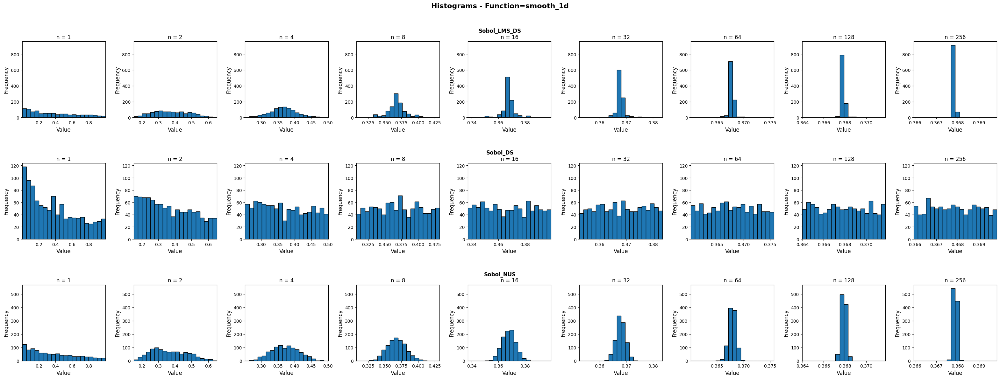

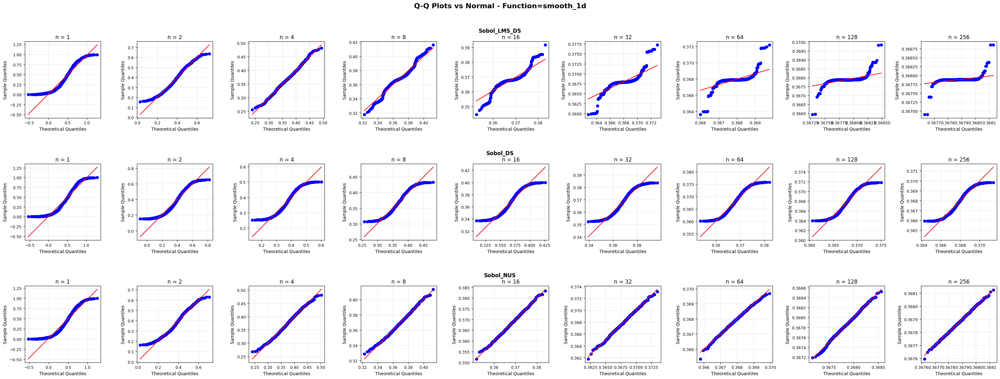

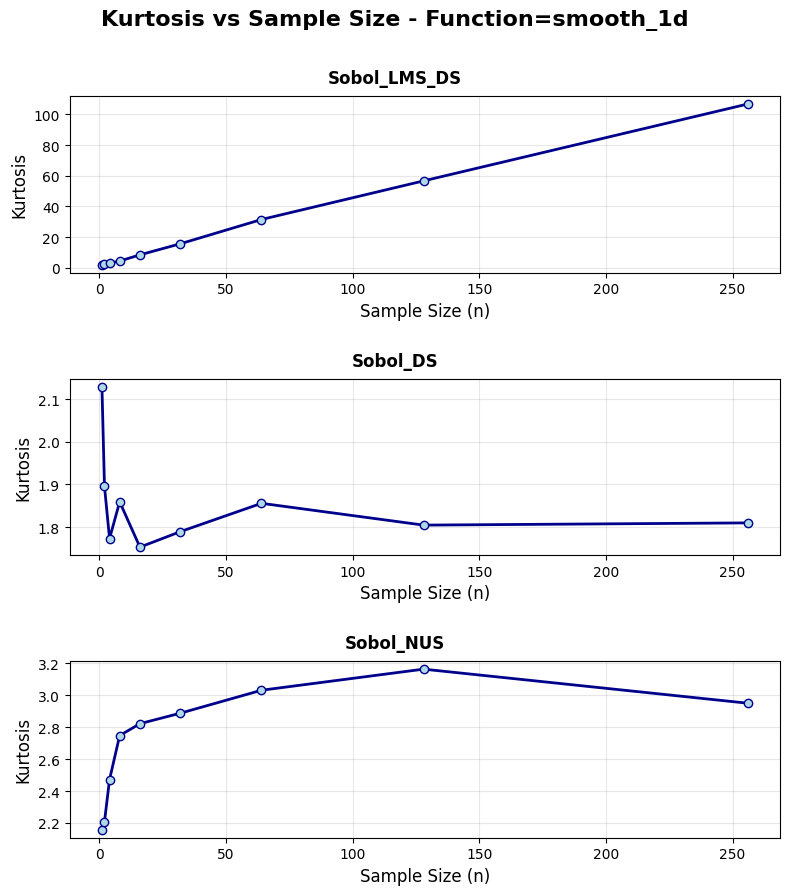

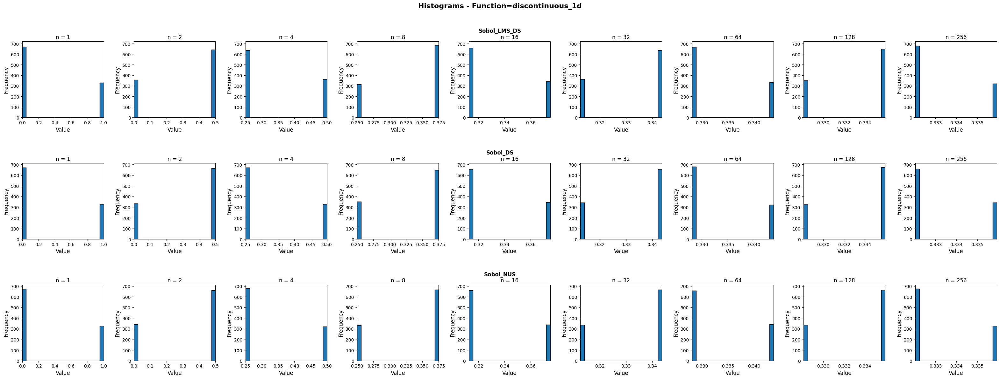

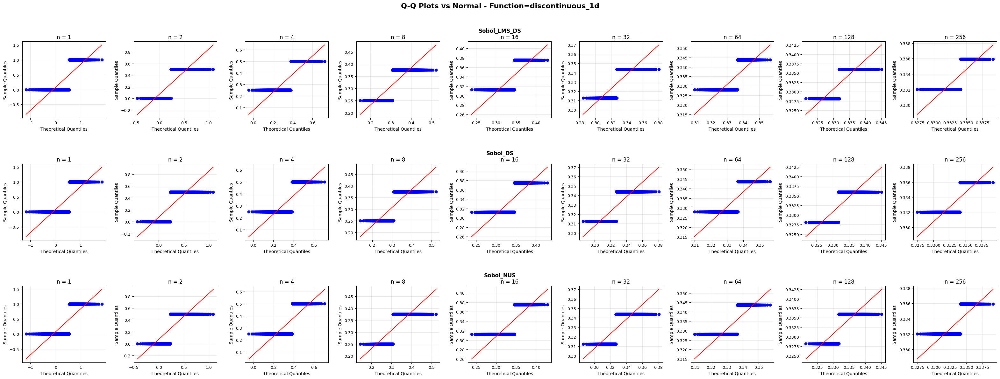

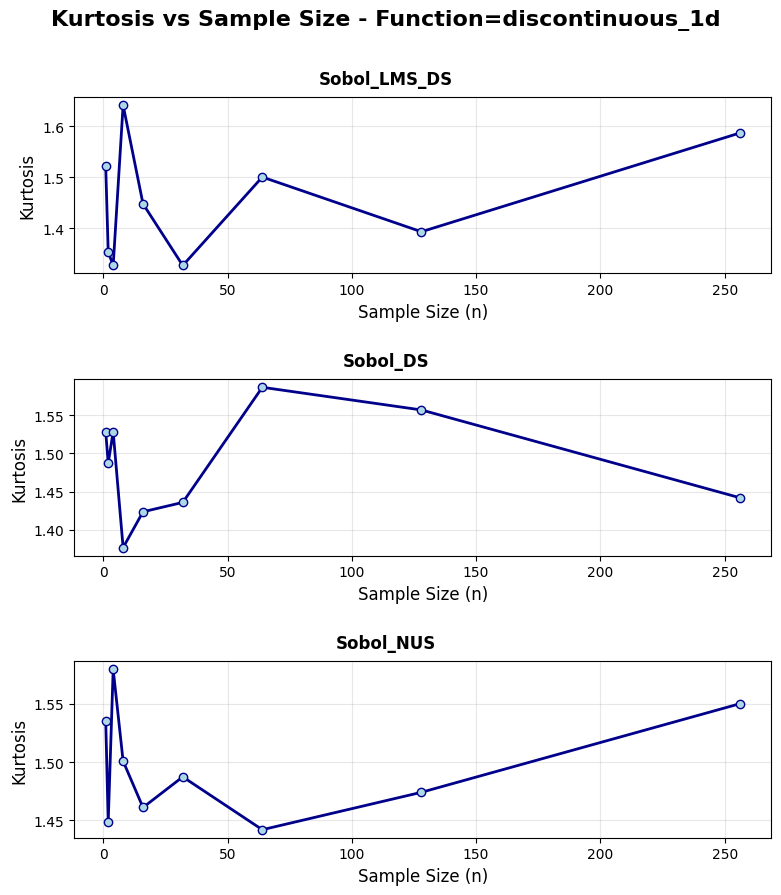

In [30]:
for i_f, (fname, ffunc) in enumerate(fs.items()):

    fig, axes = plt.subplots(
        nrows=len(labels),
        ncols=len(n_vary),
        figsize=(3.5*len(n_vary), 4*len(labels)),
        squeeze=False
    )

    x_lims = []
    for j in range(len(n_vary)):
        col_data = []
        for i_l in range(len(labels)):
            data = qmc_arr_func[i_l, i_f, j]
            if data is not None:
                col_data.append(data)
        if col_data:
            all_data_j = np.concatenate(col_data)
            x_lims.append((all_data_j.min(), all_data_j.max()))
        else:
            x_lims.append((0, 1))

    # --- make histograms ---
    for i_l, label in enumerate(labels):

        max_ylim_row = 0
        for j, n in enumerate(n_vary):
            data = qmc_arr_func[i_l, i_f, j]
            if data is None:
                continue
            counts, _, _ = axes[i_l, j].hist(
                data, bins=20, range=x_lims[j], edgecolor="black"
            )
            max_ylim_row = max(max_ylim_row, counts.max())

        for j, n in enumerate(n_vary):
            ax = axes[i_l, j]
            ax.set_xlim(x_lims[j])
            ax.set_ylim(0, max_ylim_row * 1.05)
            ax.set_xlabel("Value", fontsize=12)
            ax.set_ylabel("Frequency", fontsize=12)
            ax.set_title(f"n = {n}", fontsize=12)
            ax.tick_params(axis="both", labelsize=10)

    fig.suptitle(f"Histograms - Function={fname}", fontsize=16, weight='bold', y=0.99)

    fig.tight_layout(rect=[0, 0, 1, 0.95])
    
    fig.subplots_adjust(hspace=0.6)
    
    for i_l, label in enumerate(labels):
        top_subplot = axes[i_l, 0]
        bbox = top_subplot.get_position()
        
        fig.text(
            x=0.5, 
            y=bbox.y1 + 0.02,
            s=label,
            ha='center', 
            va='bottom',
            fontsize=12, 
            weight='bold',
            transform=fig.transFigure
        )
    
    plt.show()
    
    # --- CREATE Q-Q PLOTS ---
    fig_qq, axes_qq = plt.subplots(
        nrows=len(labels),
        ncols=len(n_vary),
        figsize=(3.5*len(n_vary), 4*len(labels)),
        squeeze=False
    )
    
    for i_l, label in enumerate(labels):
        for j, n in enumerate(n_vary):
            ax = axes_qq[i_l, j]
            data = qmc_arr_func[i_l, i_f, j]
            
            if data is not None and len(data) > 0:
                stats.probplot(data, dist="norm", sparams=(np.mean(data), np.std(data)), plot=ax)
                ax.set_title(f"n = {n}", fontsize=12)
                ax.set_xlabel("Theoretical Quantiles", fontsize=10)
                ax.set_ylabel("Sample Quantiles", fontsize=10)
                ax.tick_params(axis="both", labelsize=9)
                ax.grid(True, alpha=0.3)
            else:
                ax.text(0.5, 0.5, 'No Data', ha='center', va='center', 
                       transform=ax.transAxes, fontsize=12)
                ax.set_title(f"n = {n}", fontsize=12)
    
    fig_qq.suptitle(f"Q-Q Plots vs Normal - Function={fname}", fontsize=16, weight='bold', y=0.99)
    
    fig_qq.tight_layout(rect=[0, 0, 1, 0.95])
    fig_qq.subplots_adjust(hspace=0.6)
    
    for i_l, label in enumerate(labels):
        top_subplot = axes_qq[i_l, 0]
        bbox = top_subplot.get_position()
        
        fig_qq.text(
            x=0.5,
            y=bbox.y1 + 0.02,
            s=label,
            ha='center', 
            va='bottom',
            fontsize=12, 
            weight='bold',
            transform=fig_qq.transFigure
        )
    
    plt.show()

    # --- CREATE KURTOSIS vs n_vary PLOTS ---
    fig_kurt, axes_kurt = plt.subplots(
        nrows=len(labels),
        ncols=1,
        figsize=(8, 3*len(labels)),
        squeeze=False
    )
    
    for i_l, label in enumerate(labels):
        ax = axes_kurt[i_l, 0]
        
        kurt_values = kurr_func[i_l, i_f, :]
        
        ax.plot(n_vary, kurt_values, 'o-', linewidth=2, markersize=6, 
               color='darkblue', markerfacecolor='lightblue', markeredgecolor='darkblue')
        
        ax.set_xlabel("Sample Size (n)", fontsize=12)
        ax.set_ylabel("Kurtosis", fontsize=12)
        ax.grid(True, alpha=0.3)
        ax.tick_params(axis="both", labelsize=10)
    
    fig_kurt.suptitle(f"Kurtosis vs Sample Size - Function={fname}", fontsize=16, weight='bold', y=0.99)
    
    fig_kurt.tight_layout(rect=[0, 0, 1, 0.95])
    fig_kurt.subplots_adjust(hspace=0.6)
    
    for i_l, label in enumerate(labels):
        top_subplot = axes_kurt[i_l, 0]
        bbox = top_subplot.get_position()
        
        fig_kurt.text(
            x=0.5,  
            y=bbox.y1 + 0.01,  
            s=label,
            ha='center', 
            va='bottom',
            fontsize=12, 
            weight='bold',
            transform=fig_kurt.transFigure
        )
    
    plt.show()

### Identifying cases where kurtosis goes quite high for the largest $n$

Cases with kurtosis going quite high for largest $n$ are: 
* knk (d = 1) LMS_DS - Sobol
* smo (d = 1) LMS_DS - Sobol
* fin (d = 1) LMS_DS - Sobol
* smooth_anyd (d = 1,2,4,8) LMS_DS - Sobol
* smooth_1d LMS_DS - Sobol
